##

In [ ]:
if abs(observation[2] + observation[3]) > 0: 
    action = 1 
else: 
    action = 0 

#### when action = 0:  
   **next_state = A * state + a**


>     A                  (4, 4) 
>     next_state         (4, 1) 
>     state              (4, 1) 
>     a                  (4, 1) 

In [62]:
D.head()

,0,1,2,3,4,5,6,7,8
0,-0.043240,0.202114,0.037589,-0.272485,0.0,-0.039198,0.006477,0.032139,0.031812
1,-0.039069,0.201123,0.032775,-0.250560,0.0,-0.035046,0.005549,0.027764,0.052278
2,-0.034935,0.200262,0.028810,-0.231517,0.0,-0.030930,0.004740,0.024179,0.070112
3,-0.030835,0.199508,0.025582,-0.214845,0.0,-0.026845,0.004029,0.021285,0.085797
4,-0.026764,0.198840,0.023001,-0.200096,0.0,-0.022788,0.003397,0.018999,0.099753


In [63]:
A, a = lineartrain(0)
B, b = lineartrain(1)
A, a

(array([[ 9.9999988e-01,  2.0000566e-02, -1.1133827e-06,  3.6114440e-07],
        [ 1.0319878e-08,  9.9999952e-01, -1.4286920e-02, -1.3106083e-08],
        [ 4.5451921e-05,  9.7838006e-07,  9.9999851e-01,  1.9999916e-02],
        [-4.4161221e-05,  4.1686199e-04,  2.7598068e-01,  9.9941975e-01]],
       dtype=float32), array([[ 5.7470335e-09],
        [-1.9512120e-01],
        [ 4.7807088e-08],
        [ 2.9255211e-01]], dtype=float32))

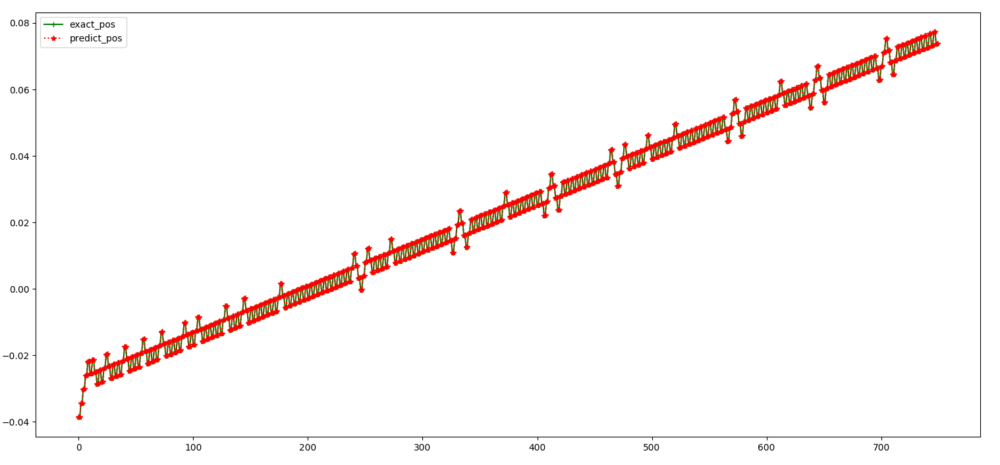

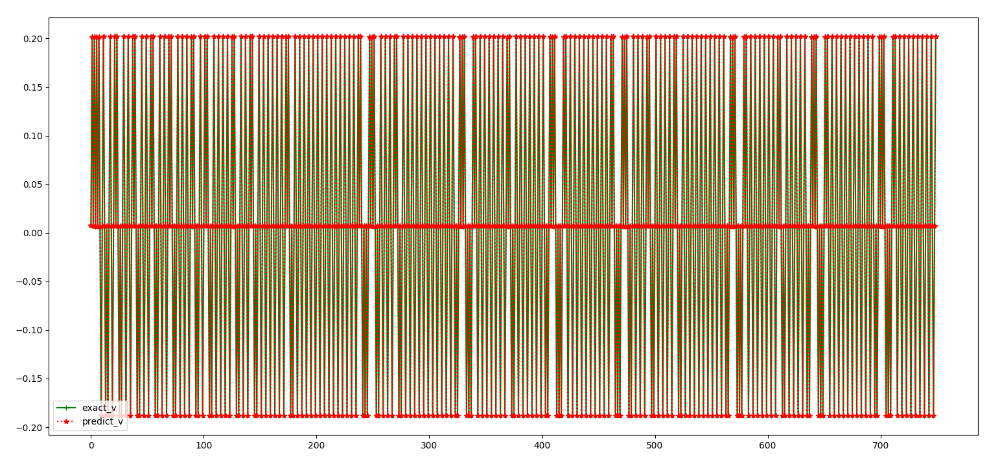

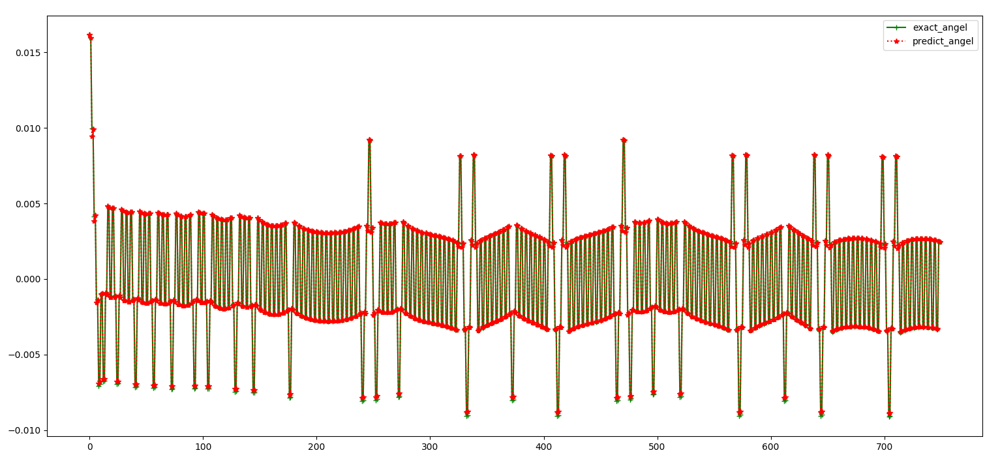

## zongjie

In [61]:
D = pd.read_csv('data0.csv', header = None)

In [ ]:
D.head()

In [6]:
env = gym.make('CartPole-v0')
env._max_episode_steps = 30000

In [29]:
def f(params):
    score = np.zeros(100)
    for i_episode in range(100):
        observation = env.reset()
        t = 0
        while True:
            env.render()
            y0 = np.matmul(A, observation.reshape(4, 1)) + a
            y1 = np.matmul(B, observation.reshape(4, 1)) + b
            y0 = np.concatenate([y0, y0**2])
            y1 = np.concatenate([y1, y1**2])
            if np.matmul(params, y1) > np.matmul(params, y0):
                action = 0
            else:
                action = 1
            observation,reward,done,info=env.step(action)
            if done:
                score[i_episode] = t + 1
                break
            t += 1
    u = np.mean(score)
    sigma = np.std(score)
    score = score[abs((score - u) / sigma) <= 3]
    return -round(np.mean(score))

In [55]:
def f2(params):
    score = np.zeros(20)
    for i_episode in range(20):
        observation = env.reset()
        t = 0
        while True:
            env.render()
            y0 = np.matmul(A, observation.reshape(4, 1)) + a
            y1 = np.matmul(B, observation.reshape(4, 1)) + b
            y0 = [y0[0][0], y0[0][0] ** 2, abs(y0[2][0] + y0[3][0])]
            y1 = [y1[0][0], y1[0][0] ** 2, abs(y1[2][0] + y1[3][0])]
            #the larger, the worse
            if np.matmul(params, y1) > np.matmul(params, y0):
                action = 0
            else:
                action = 1
            observation,reward,done,info=env.step(action)
            if done:
                score[i_episode] = t + 1
                break
            t += 1
    u = np.mean(score)
    sigma = np.std(score)
    score = score[abs((score - u) / sigma) <= 2]
    print(u, params)
    if (u > 10000):
        candidate.append(params)
    return -np.mean(score)

In [56]:
candidate = []

In [57]:
x = np.array([1, 1, 1])
for i in range(3):
    opt = minimize(f2, x0=x, method = 'TNC')
    candidate.append(opt.x)
    x = np.random.randn(3)

3794.55 [1. 1. 1.]
5997.75 [1. 1. 1.]
6098.3 [1.00000001 1.         1.        ]
5676.6 [1.         1.00000001 1.        ]
4116.55 [1.         1.         1.00000001]
7085.25 [1.00000003 1.00000001 0.99999999]
5218.0 [1.00000003 1.00000001 0.99999999]
6281.05 [1.00000004 1.00000001 0.99999999]
5677.35 [1.00000003 1.00000002 0.99999999]
6524.1 [1.00000003 1.00000001 1.        ]
5516.6 [1.00000002 1.00000001 0.99999999]
6785.55 [1.00000002 1.00000001 0.99999999]
3717.15 [1.00000003 1.00000001 0.99999999]
5240.6 [1.00000002 1.00000002 0.99999999]
2793.85 [1.00000002 1.00000001 1.        ]
5539.1 [1.00000002 1.00000001 0.99999999]
7115.3 [1.00000002 1.00000001 0.99999999]
5412.5 [1.00000003 1.00000001 0.99999999]
6707.3 [1.00000002 1.00000002 0.99999999]
6109.85 [1.00000002 1.00000001 1.        ]
6545.1 [1.22721652 0.16065211 0.28144977]
5889.8 [1.22721652 0.16065211 0.28144977]
3513.05 [1.22721653 0.16065211 0.28144977]
4664.3 [1.22721652 0.16065212 0.28144977]
4465.9 [1.22721652 0.16065211

In [44]:
for u in candidate:
    print(f2(u))

In [2]:
import gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
import torch.nn as nn
from torch.autograd import Variable
import torch.functional as F
import random
import xgboost
from scipy.optimize import minimize
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, RidgeCV

In [58]:
TestLinearMatrix(A, a, B, b)

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663])]
[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398])]
[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714])]
[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.2835

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [ 1.79811795]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [-1.52146639]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [ 0.05586026]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [ 1.49039415]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

       [-0.0883861 ]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [-0.04845117]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

       [ 1.51138706]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

       [-0.96508856]])] 
 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

 [array([-0.04621399, -0.15804872,  0.04556086,  0.28323663]), array([-0.04937496, -0.3537899 ,  0.0512256 ,  0.58993398]), array([-0.05645076, -0.15942122,  0.06302428,  0.31381714]), array([-0.05963918,  0.03474895,  0.06930062,  0.041657  ]), array([-0.0589442 , -0.16129479,  0.07013376,  0.35537484]), array([-0.0621701 , -0.35734019,  0.07724126,  0.66932244]), array([-0.0693169 , -0.16337237,  0.0906277 ,  0.40192458]), array([-0.07258435, -0.35965505,  0.0986662 ,  0.7217484 ]), array([-0.07977745, -0.16602637,  0.11310116,  0.46167878]), array([-0.08309798,  0.0273306 ,  0.12233474,  0.20667729]), array([-0.08255137, -0.16930901,  0.12646828,  0.53530908]), array([-0.08593755,  0.02382891,  0.13717447,  0.28499857]), array([-0.08546097, -0.17295565,  0.14287444,  0.61760556]), array([-0.08892008, -0.36975392,  0.15522655,  0.95165746]), array([-0.09631516, -0.56658561,  0.1742597 ,  1.28880864]), array([-0.10764687, -0.76344246,  0.20003587,  1.63059532]), array([-0.12291572, -0

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

[array([[-0.04621401],
       [-0.15807676],
       [ 0.04749034],
       [ 0.28357948]]), array([[-0.04937498],
       [-0.35382077],
       [ 0.05340292],
       [ 0.59027312]]), array([[-0.05657009],
       [-0.1594009 ],
       [ 0.06539699],
       [ 0.31341108]]), array([[-0.05974894],
       [ 0.03479908],
       [ 0.07189169],
       [ 0.04101579]]), array([[-0.05894423],
       [-0.16136235],
       [ 0.07303099],
       [ 0.35617863]]), array([[-0.06217012],
       [-0.35741791],
       [ 0.08044271],
       [ 0.67015742]]), array([[-0.0694964 ],
       [-0.16332307],
       [ 0.0940673 ],
       [ 0.40100333]]), array([[-0.07258438],
       [-0.35978828],
       [ 0.10271302],
       [ 0.72316752]]), array([[-0.08000107],
       [-0.1659442 ],
       [ 0.11741158],
       [ 0.46018553]]), array([[-0.08332141],
       [ 0.0274781 ],
       [ 0.1269765 ],
       [ 0.20466874]]), array([[-0.08255139],
       [-0.16953839],
       [ 0.131582  ],
       [ 0.53791678]]), array([[-

0.008719350737161423

In [9]:
def TestLinearMatrix(A, a, B, b):
    sum = 0
    predict = []
    exact = []
    for i_episode in range(20):
        observation = env.reset()
        for t in range(10000):
            env.render()
            action = env.action_space.sample()
            y0 = np.matmul(A, observation.reshape(4, 1)) + a
            y1 = np.matmul(B, observation.reshape(4, 1)) + b
            observation,reward,done,info=env.step(action)
            if action == 0:
                predict.append(y0)
            else:
                predict.append(y1)
            exact.append(observation)
            env.render()
            print(predict,'\n', exact)
            if done:
                break
    return loss(np.array(predict).reshape(-1), np.array(exact).reshape(-1))
    

In [ ]:
def run(method, ew):
    score = []
    for i_episode in range(20):
        observation = env.reset()
        print("=============================================")
        for t in range(10000):
            action = env
            observation,reward,done,info=env.step(action)
            env.render()
            if done:
                print("Episode finished after {} timesteps".format(t+1))
                score.append(t+1)
                break
    return np.mean(np.array(score))

In [3]:
def loss(y_predict, y_target):
    return ((y_predict - y_target)**2).sum()

In [4]:
def lineartrain(action):
    D = torch.tensor(pd.read_csv('data{}.csv'.format(action), header = None).values, dtype=torch.float)
    x_dataset = D[:,0:4].t()
    y_dataset = D[:,5:9].t()
    n= 4

    A = torch.randn((n, n), requires_grad = True)
    b = torch.randn((4, 1), requires_grad = True)

    optimizer = optim.Adam([A, b], lr = 0.001)

    for t in range(200000):
        optimizer.zero_grad()
        y_predicted = A.mm(x_dataset) + b
        current_loss = loss(y_predicted, y_dataset)
        current_loss.backward()
        optimizer.step()
        if current_loss < 0.001:
            return A.detach().numpy(), b.detach().numpy()


In [5]:
A, a = lineartrain(0)
B, b = lineartrain(1)

In [24]:
A, a

(array([[ 1.0000000e+00,  2.0000011e-02, -8.6545292e-08,  1.9063853e-08],
        [ 9.6184351e-08,  9.9999869e-01, -1.4286327e-02, -6.2227770e-07],
        [-1.1246829e-08,  2.8609592e-09,  9.9999994e-01,  2.0000001e-02],
        [-3.3518585e-04,  3.1545463e-03,  3.1878245e-01,  1.0026963e+00]],
       dtype=float32), array([[ 3.6427844e-10],
        [-1.9512123e-01],
        [-1.3289457e-10],
        [ 2.9277134e-01]], dtype=float32))

In [64]:
B, b

(array([[ 9.9995482e-01,  2.0425035e-02, -3.9787360e-02, -5.7976576e-04],
        [ 1.7955095e-07,  9.9999869e-01, -1.4293073e-02, -7.3635579e-07],
        [-1.3007304e-08,  1.2111884e-07,  9.9998885e-01,  1.9999843e-02],
        [ 6.4456863e-08, -5.1967859e-06,  3.1537077e-01,  9.9999470e-01]],
       dtype=float32), array([[ 1.2654233e-04],
        [ 1.9512123e-01],
        [ 3.4660967e-08],
        [-2.9267576e-01]], dtype=float32))